In [30]:
import math

import matplotlib.pyplot as plt
import librosa.feature
import librosa.display
import numpy as np
from IPython.display import Audio, display
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import ruptures as rpt  # our package
import IPython.display as ipd
import pandas as pd


In [31]:
def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

Loaded signal with shape: (5934096,), Sampling rate: 44100


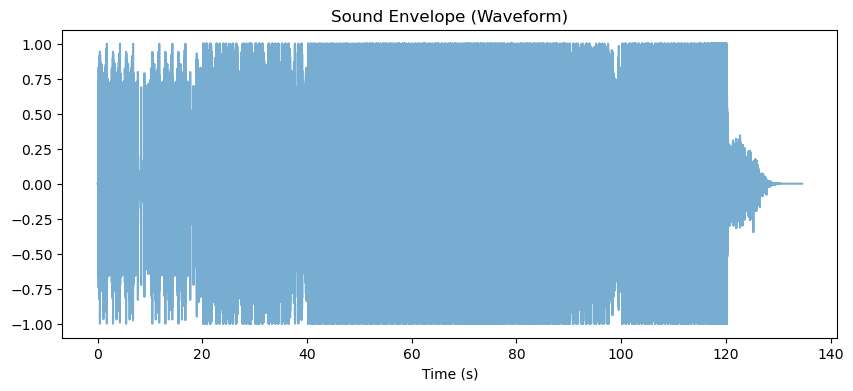

In [32]:
# GET THE SONG DURATION BY FILE
y, sr = librosa.load(r"DO NOT TOUCH/Audio Files/Emmanuel/35. Vitalic - Vigipirate.flac",sr=None)
durationOfSong = librosa.get_duration(y=y, sr=sr)

signal, sr = librosa.load(
    r"DO NOT TOUCH/Audio Files/Emmanuel/35. Vitalic - Vigipirate.flac",
    sr = None,                                                                      # <-- CAN BE CHANGED :))
    duration=durationOfSong
)

print(f"Loaded signal with shape: {signal.shape}, Sampling rate: {sr}")

# listen to the music
display(Audio(data=signal, rate=sr))

# Plot waveform
time = np.arange(len(signal)) / sr
plt.figure(figsize=(10, 4))
plt.plot(time, signal, alpha=0.6)
plt.xlabel("Time (s)")
plt.title("Sound Envelope (Waveform)")
plt.show()

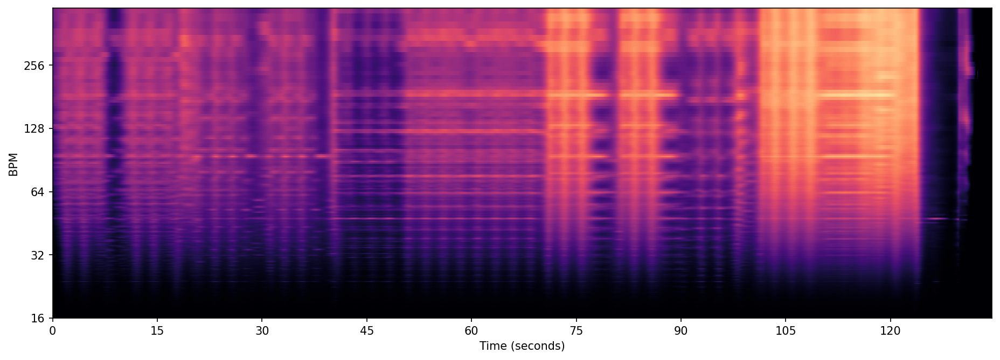

In [33]:
# Compute the onset strength
hop_length_tempo = 512                                                                       # <-- CAN BE CHANGED :))
oenv = librosa.onset.onset_strength(
    y=signal, sr=sr, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sr,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="tempo",
)

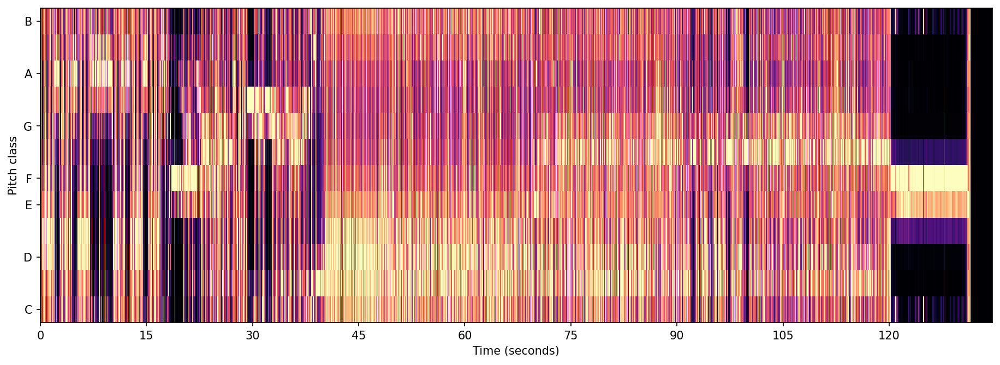

In [34]:
# Compute the Chromagram
# Extract chroma features (try chroma_cqt or chroma_cens)
chroma = librosa.feature.chroma_stft(y=signal, sr=sr, n_chroma=12)                       # <-- CAN BE CHANGED :))  - Go into the packages.. im sorry..

# Normalize chroma features
chroma = librosa.util.normalize(chroma, axis=1)                       # <-- see if this does anything

# Transpose to shape (time_steps, features)
chroma_T = chroma.T  # shape: (frames, 12)

# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sr,
    x_axis="s",
    y_axis="chroma",
)

Detected change points: [2.32199546e-02 1.34571247e+02]


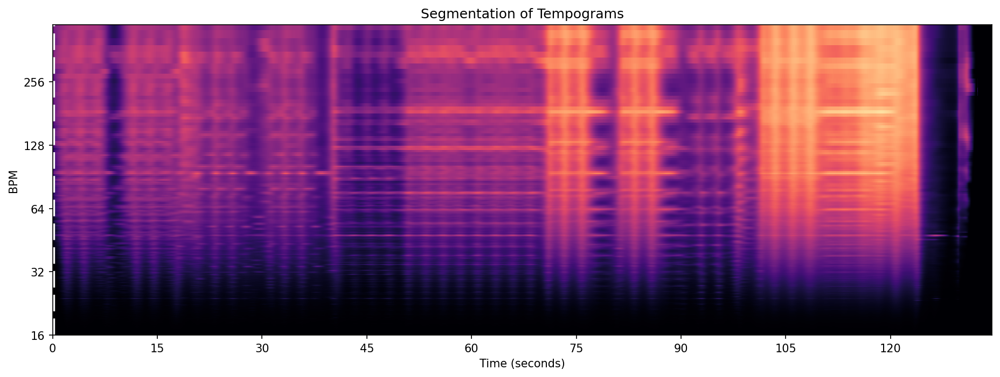

In [35]:
# Choose detection method TEMPOGRAMS
algoTEM = rpt.KernelCPD(kernel="cosine").fit(tempogram.T)                        # <-- CAN BE CHANGED :))

# === TEMPO ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
n_bkps = 40                                                                    # <-- CAN BE CHANGED :))
bkpsTEM = algoTEM.predict(n_bkps=n_bkps)
bkps_timesTEM = librosa.frames_to_time(bkpsTEM, sr=sr, hop_length=512)


# === Ensure segments are at least desired seconds apart ===
min_segment_length = 4  # in seconds
filtered_bkps_times = [bkps_timesTEM[0]]  # Always keep the first change point
for b in bkps_timesTEM[1:]:
    if b - filtered_bkps_times[-1] >= min_segment_length:
        filtered_bkps_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkps_times[-1] != bkps_timesTEM[-1]:
    filtered_bkps_times.append(bkps_timesTEM[-1])

# Use filtered breakpoints
bkps_timesTEM = np.array(filtered_bkps_times)

# Now bkps contains the detected change points
print(f"Detected change points: {bkps_timesTEM}")

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    label= "Segmentation of Tempograms",
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Tempograms")

# === TEMPO IS WHITE LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

Detected change points: [  0.13931973   5.20126984  12.00471655  17.00861678  22.01251701
  27.20217687  32.69369615  37.72081633  50.31764172  69.88045351
  91.93941043  97.59346939 120.23292517 131.03020408 134.57124717]


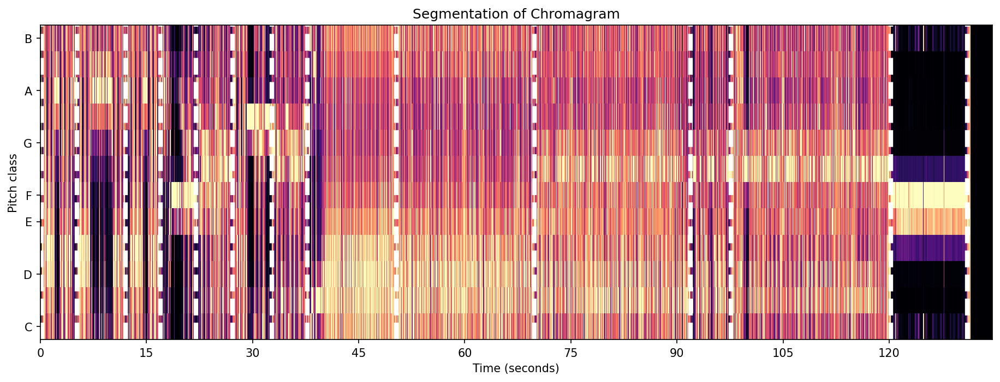

In [36]:
# Choose detection method CHROMAGRAMS
algoCH = rpt.KernelCPD(kernel="rbf").fit(chroma_T)                            # <-- CAN BE CHANGED :))

# === CHROMA ALGORITHM NUMBER OF DESIRED CHANGES (bkps) ===
bkpsCH = algoCH.predict(n_bkps=n_bkps)
bkpsCH_times = librosa.frames_to_time(bkpsCH, sr=sr, hop_length=hop_length_tempo)

# === Ensure segments are at least desired seconds apart ===
min_segment_lengthChroma = 5  # in seconds
filtered_bkpsCH_times = [bkpsCH_times[0]]  # Always keep the first change point
for b in bkpsCH_times[1:]:
    if b - filtered_bkpsCH_times[-1] >= min_segment_lengthChroma:
        filtered_bkpsCH_times.append(b)

# Ensure the final segment reaches the end
if filtered_bkpsCH_times[-1] != bkpsCH_times[-1]:
    filtered_bkpsCH_times.append(bkpsCH_times[-1])

# Use filtered breakpoints
bkpsCH_times = np.array(filtered_bkpsCH_times)

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    chroma,
    ax=ax,
    x_axis="s",
    y_axis="chroma",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Add title
ax.set_title("Segmentation of Chromagram")

# === CHROMA IS WHITE LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)

print("Detected change points:", bkpsCH_times)

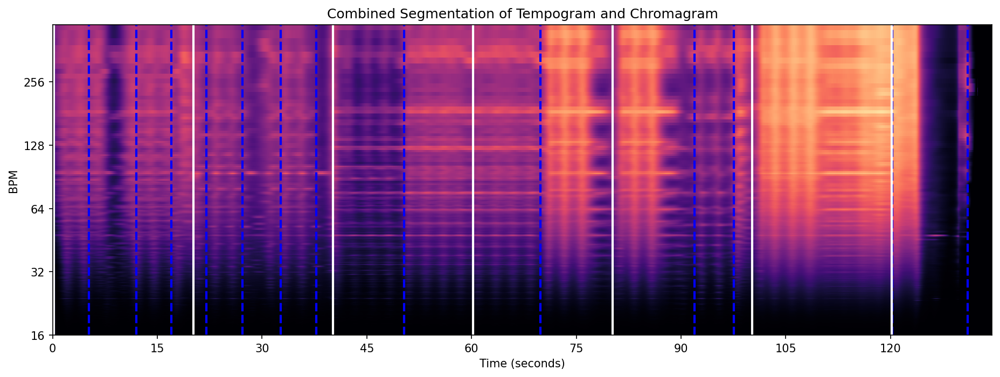

In [37]:
# === NOW COMPARE BOTH WITH GroundTruth ===
# Load GT only TIMESTAMPS
GT = "DO NOT TOUCH/GroundTruthData/GroundTruthRight/parsed_data_35.csv"
gt_data = pd.read_csv(GT)
gt_times = gt_data["TIMESTAMP"].values

# display the figure
fig, ax = fig_ax()
# Display the tempogram as the background
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sr,
)
# Title
ax.set_title("Combined Segmentation of Tempogram and Chromagram")


# === TEMPO IS GREEN LINES ===
for b in bkps_timesTEM[:-1]:
    ax.axvline(b, ls="--", color="green", lw=3, label="Tempo Segmentation" if b == bkps_timesTEM[0] else None)

# === CHROMA IS RED LINES ===
for b in bkpsCH_times[:-1]:
    ax.axvline(b, ls="--", color="blue", lw=2, label="Chromagram Segmentation" if b == bkpsCH_times[0] else None)

# === GroundTruth IS WHITE LINES ===
for b in gt_times:
    ax.axvline(b, ls="-", color="white", lw=2, label="Ground Truth" if b == gt_times[0] else None)
plt.show()


In [38]:
# === CALCULATES SCORE WITHIN 3s OF GT ====
def gaussian_score_flat_top(time_diff, sigma=0.9, flat_top=0.25):
    abs_diff = abs(time_diff)
    if abs_diff <= flat_top:
        return 100.0
    elif abs_diff >= 3:
        return 0.0
    else:
        adjusted_diff = abs_diff - flat_top
        return 100.0 * math.exp(- (adjusted_diff ** 2) / (2 * sigma ** 2))

# === Load ground truth from CSV ===
ground_truth_path = r"DO NOT TOUCH/GroundTruthData/GroundTruthRight/parsed_data_35.csv"
gt_times = pd.read_csv(ground_truth_path)['TIMESTAMP'].values  # Extract only 'TIMESTAMP' column

# === Scoring function ===
def evaluate_segmentation(predicted_times, gt_times, label=""):
    scores = []
    matched_preds = []

    for gt in gt_times:
        if len(predicted_times) == 0:
            scores.append(0.0)
            matched_preds.append(None)
            continue
        closest_pred = min(predicted_times, key=lambda p: abs(p - gt))
        matched_preds.append(closest_pred)
        time_diff = closest_pred - gt
        score = gaussian_score_flat_top(time_diff)
        scores.append(score)

    # === Print results ===
    print(f"\n--- Evaluation Results for {label} ---")
    for i, (gt, pred, score) in enumerate(zip(gt_times, matched_preds, scores), 1):
        if pred is not None:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred={pred:.2f}s | Diff={pred - gt:+.2f}s | Score={score:.2f}")
        else:
            print(f"{i:02}: GT={gt:.2f}s | Closest Pred=None | Diff=None | Score=0.00")

    avg_score = np.mean(scores)
    print(f"\nAverage Score for {label}: {avg_score:.2f}\n")
    return scores, avg_score

# === Evaluate TEMPO ===
tempo_scores, avg_tempo_score = evaluate_segmentation(bkps_timesTEM, gt_times, label="Tempo")

# === Evaluate CHROMAGRAM ===
chroma_scores, avg_chroma_score = evaluate_segmentation(bkpsCH_times, gt_times, label="Chromagram")



--- Evaluation Results for Tempo ---
01: GT=0.18s | Closest Pred=0.02s | Diff=-0.16s | Score=100.00
02: GT=20.18s | Closest Pred=0.02s | Diff=-20.16s | Score=0.00
03: GT=40.18s | Closest Pred=0.02s | Diff=-40.16s | Score=0.00
04: GT=60.18s | Closest Pred=0.02s | Diff=-60.16s | Score=0.00
05: GT=80.18s | Closest Pred=134.57s | Diff=+54.39s | Score=0.00
06: GT=100.18s | Closest Pred=134.57s | Diff=+34.39s | Score=0.00
07: GT=120.18s | Closest Pred=134.57s | Diff=+14.39s | Score=0.00

Average Score for Tempo: 14.29


--- Evaluation Results for Chromagram ---
01: GT=0.18s | Closest Pred=0.14s | Diff=-0.04s | Score=100.00
02: GT=20.18s | Closest Pred=22.01s | Diff=+1.83s | Score=21.27
03: GT=40.18s | Closest Pred=37.72s | Diff=-2.46s | Score=4.93
04: GT=60.18s | Closest Pred=69.88s | Diff=+9.70s | Score=0.00
05: GT=80.18s | Closest Pred=69.88s | Diff=-10.30s | Score=0.00
06: GT=100.18s | Closest Pred=97.59s | Diff=-2.59s | Score=3.45
07: GT=120.18s | Closest Pred=120.23s | Diff=+0.05s | Sc